## Environment
Initialization of libraries.

In [1]:
import pandas as pd
import numpy as np
from os import listdir
from os.path import join
import json
from scipy.stats import gaussian_kde

# Visualization libraries
import folium
from folium import plugins
from folium.plugins import HeatMap
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from wordcloud import WordCloud, STOPWORDS
from PIL import Image
import urllib
import requests
import chart_studio
import chart_studio.plotly as py
import plotly.offline as pyo
# Set notebook mode to work in offline
pyo.init_notebook_mode()

chart_studio.tools.set_credentials_file(username='arnau.gp', 
                                        api_key='YYQ76H4gviCx9st7FhXS')

## 1. Motivation
People in cities live in a constant rush. Hyperconnection through social networks barely let them move the eyes out of the smartphone screen and observe the surroundings. Urban trees are a silent part of the cities' landscape. However, they are certainly unknown for us, but hopefully Data Visualization is going to help us discover some insights, such as:
* Which are the most common tree species?
* How are they distributed?
* How many trees per inhabitant does Barcelona have?
* Which type of irrigation is nowadays used?
* Which is the oxygen balance of Barcelona (i.e. trees produced oxygen vs consumed by people)?

What is your dataset?
Why did you choose this/these particular dataset(s)?
What was your goal for the end user's experience?  

**Datasets**
1. Gardens and parks
    * Source: https://opendata-ajuntament.barcelona.cat/data/es/dataset/culturailleure-parcsjardins  
    * File: *C006_Parcs_i_jardins.csv*  
    * Publication date: 17/02/2020
    * Data scope: Gardens and parks registered as of 17/02/2020
2. Trees
    * Source 1: https://opendata-ajuntament.barcelona.cat/data/es/dataset/arbrat-viari  
    * Source 2: https://opendata-ajuntament.barcelona.cat/data/es/dataset/arbrat-zona  
    * File 1: *2019_1T_arbrat_viari.csv*  
    * File 2: *2019_1T_arbrat_zona.csv*  
    * Publication date 1: 01/04/2019  
    * Publication date 2: 01/04/2019  
    * Data scope: Trees registered as of 01/04/2019

**Election of datasets**  
The purpose of this section is to explore and unveil some insights related to the *green elements* of Barcelona.  
After exploring the data availabe in the Open Data Barcelona portal (https://opendata-ajuntament.barcelona.cat/), the Barcelona's city hall open data portal, 3 datasets were selected. The first dataset contains the gardens and parks, and the last two the trees registered.  
So, these datasets were found to be the most relevant to describe Barcelona *green elements*.
1. Gardens and parks
    * The selected dataset contains the total number of parks registered by Barcelona's city hall on the date of February 17th of 2020.
2. Trees
    * The files used correspond to the trees registered by the city hall of Barcelona for the first quarter of 2019. Data has been combined into a single file since the sources structure is the same. They were initally split in 2 files since *arbrat_viari* contains trees next to roads and *arbrat_zona* the rest of trees.
    
**End user experience**  
The graphic elements created using the afforementioned datasets have been created following one priority: **user interactivity**. The user should be capable to explore deeper those elements that might be more interesting for itself.

## 2. Basic stats
The basic stats are divided into two sections: Gardens and parks, and Trees.

### Gardens and parks

The dataset has only been used for one plot, therefore the only change has been to fill NaN values with a known identifier. This way, data can be filtered easily if necessary.  
The dataset is composed by 384 rows and 30 columns.

In [2]:
f = "environment/C006_Parcs_i_jardins.csv"
df_gardens = pd.read_csv(f)
df_gardens.fillna('NO_DATA', inplace=True)
print("Dataset columns: ")
print(df_gardens.columns)
print("\n Total rows: " +str(df_gardens.shape[0]))
print("\n Total rows: " +str(df_gardens.shape[1]))
df_gardens.head()

Dataset columns: 
Index(['CODI_EQUIPAMENT', 'EQUIPAMENT', 'SECCIO', 'TIPUS_VIA', 'NOM_CARRER',
       'NUM_CARRER_1', 'NUM_CARRER_2', 'CODI_BARRI', 'NUM_BARRI',
       'CODI_DISTRICTE', 'NOM_DISTRICTE', 'CODI_POSTAL', 'CODI_POBLACIO',
       'POBLACIO', 'LATITUD', 'LONGITUD', 'X_ETRS89', 'Y_ETRS89', 'X_ED50',
       'Y_ED50', 'TELEFON_NUM', 'TELEFON_TIPUS', 'TELEFON_INFO_COM',
       'HORARI_PERIODE_INICI', 'HORARI_PERIODE_FI', 'HORARI_DIES',
       'HORARI_HORES_INICI', 'HORARI_HORES_FI', 'HORARI_OBSERVACIONS',
       'Unnamed: 29'],
      dtype='object')

 Total rows: 384

 Total rows: 30


,CODI_EQUIPAMENT,EQUIPAMENT,SECCIO,TIPUS_VIA,NOM_CARRER,NUM_CARRER_1,NUM_CARRER_2,CODI_BARRI,NUM_BARRI,CODI_DISTRICTE,...,TELEFON_NUM,TELEFON_TIPUS,TELEFON_INFO_COM,HORARI_PERIODE_INICI,HORARI_PERIODE_FI,HORARI_DIES,HORARI_HORES_INICI,HORARI_HORES_FI,HORARI_OBSERVACIONS,Unnamed: 29
0,61171409,Zoo de Barcelona,#,Parc,Ciutadella,0,0,4,"Sant Pere, Santa Caterina i la Ribera",1,...,937065656,Informació,NO_DATA,25/10,28/03,NO_DATA,10:00:00,17:30:00,Els grups superiors a 20<br> persones han de c...,NO_DATA
1,61171409,Zoo de Barcelona,#,Parc,Ciutadella,0,0,4,"Sant Pere, Santa Caterina i la Ribera",1,...,937065656,Informació,NO_DATA,25/10,28/03,0,10:00:00,17:30:00,,NO_DATA
2,61171409,Zoo de Barcelona,#,Parc,Ciutadella,0,0,4,"Sant Pere, Santa Caterina i la Ribera",1,...,937065656,Informació,NO_DATA,25/10,28/03,NO_DATA,10:00:00,14:00:00,,NO_DATA
3,61171409,Zoo de Barcelona,#,Parc,Ciutadella,0,0,4,"Sant Pere, Santa Caterina i la Ribera",1,...,937065656,Informació,NO_DATA,25/10,28/03,1.11111e+06,10:00:00,14:00:00,,NO_DATA
4,61171409,Zoo de Barcelona,#,Parc,Ciutadella,0,0,4,"Sant Pere, Santa Caterina i la Ribera",1,...,937065656,Informació,NO_DATA,29/03,31/05,0,10:00:00,19:00:00,,NO_DATA


### Trees

The dataframe *df_arbrat* has been used throughout all the plots, therefore the data cleaning and preprocessing has been done in **two steps**:
1. *df_arbrat* processing: The main dataframe cleaning includes: 
    * Changing the type of columns containing dates and creating new columns for year and month.
    * Filling NaN/NaT values to filter easily afterwards.
    * Replacing the values of some columns using dictionaries. The dataset is in Catalan and the purpose is to change data to English.
    
2. *ad_hoc* processing for each plot. For each plot, new dataframes have been created and ad_hoc cleaning and processing has been performed. Some of the most common steps include:
    * Filtering dataframe by column values.
    * Grouping data by column values.
    * Counting grouped dataframe.

Some of the **relevant features** of this dataset are:
* Date of planting
* Type of irrigation
* Location
* Type of soil cover
* Tree pit features (size, edge, cover, etc.)

The dataset **basic stats are summarized** in the following points:
* Total columns: 26
* Total rows: 203240
* Total urban trees: 203240
    * Road trees: 151224
    * Zone trees: 44478
* Total types of tree: 439
* Top 6 types of tree: 121199
* Top 6 types of tree % over all: 59.63%
* Number of trees without irrigation type known: 182260
* Percentage of trees without irrigation type known: 89.68%
* Number of trees without tree pit size known: 56735
* Percentage of trees without tree pit size known: 27.92%
* Number of trees without tree pit edge known: 23009
* Percentage of trees without tree pit edge known: 11.32%
* Number of trees without tree pit cover known: 33128
* Percentage of trees without tree pit cover known: 16.30%
* Number of trees without tree pit surface known: 10060
* Percentage of trees without tree pit surface known: 4.95%
* Number of trees without tree pit support known: 10564
* Percentage of trees without tree pit support known: 5.20%
* Number of trees without sidewalk width known: 56735
* Percentage of trees without irrigation type known: 27.92%


Given the size of the dataset, **some plots and analysis have been conducted only for the top 6 tree species**, which represent approximately the 60% of the trees.

Some **simple insights** that can be found from this first exploration are:
* Trees/square km: 2006 trees/square km
* Trees per inhabitant: 0.12 trees/inhabitant
* Delta O2 year: -1190.87988 millions of kg

Besides, following, several **plots show the basic stats** of the dataset in a visual way.

In [3]:
f = "environment/Arbrat_2019.csv"
df_arbrat = pd.read_csv(f)
# Convert dates to datetime
df_arbrat['DATA_PLANTACIO'] = pd.to_datetime(df_arbrat['DATA_PLANTACIO'], format='%d/%m/%Y', errors='coerce')
df_arbrat['ANY_PLANTACIO'] = pd.DatetimeIndex(df_arbrat['DATA_PLANTACIO']).year
df_arbrat['MES_PLANTACIO'] = pd.DatetimeIndex(df_arbrat['DATA_PLANTACIO']).month
df_arbrat['ANY_MES_PLANTACIO'] = df_arbrat['DATA_PLANTACIO'].dt.strftime('%Y-%m')
# Fill NaN values
df_arbrat.fillna('NO_DATA', inplace=True)
df_arbrat.replace({'NaT': 'NO_DATA'}, inplace=True)

# Replace column values using dict
irrigation_type_dict = {"ALTRES": "Other", 
                        "ASPERSIÓ": "Sprinkling",
                        "DIFUSIÓ": "Diffusion",
                        "GOTEIG": "Drip",
                        "MÀNEGA": "Hose",
                        "ROTATOR": "Rotary"                       
                       }
element_type_dict = {"ARBRE ZONA": "Zone tree",
                     "ARBRE VIARI": "Road tree",
                     "PALMERA ZONA": "Zone palm",
                     "PALMERA VIARI": "Road palm",
                       }
tree_pit_size_dict = {"ALTRES": "Other",
                     "ENTRE 60 I 100 cm": "60 cm < Size < 100 cm",
                     "major que o igual a  100 cm": "Size >= 100 cm",
                     "menor que o igual a 60 cm": "Size <= 60 cm",
                       }
tree_pit_edge_dict = {"ALTRES": "Other",
                     "SENSE VORA": "No edge",
                     "VORA FORMIGÓ": "Concrete edge",
                     "VORA METÀL·LICA": "Metallic edge",
                       }
tree_pit_cover_dict = {"SENSE COBERTURA": "No cover",
                       "ALTRES": "Other",
                       "ENCOIXINAT": "Cushioned",
                       "GRAVA": "Gravel",
                       "LLAMBORDA": "Cobblestone",
                       "PAVIMENT DRENAT": "Drained pavement",
                       "REIXETA FORMIGÓ": "Concrete mesh strainer",
                       "REIXETA METÀL·LICA": "Metallic mesh strainer"
                       }
tree_pit_support_dict = {"ALTRES": "Other",
                         "ESCOCELL ELEVAT": "Elevated tree pit",
                         "ESCOCELL QUADRAT": "Squared tree pit",
                         "ESCOCELL RECTANGULAR": "Rectangular tree pit",
                         "ESCOCELL RODÓ": "Circular tree pit",
                         "ESCOCELL TRIANGULAR": "Triangular tree pit",
                         "JARDINERA": "Planter",
                         "PARTERRE": "Flower bed",
                         "PARTERRE ELEVAT": "Elevated flower bed"
                       }
tree_pit_surface_dict = {"ALTRES": "Other",
                         "GESPA": "Grass",
                         "GESPA AMB VEGETACIÓ": "Grass with vegetation",
                         "PAVIMENT": "Pavement",
                         "SAULÓ AMB VEGETACIÓ": "Sandstone with vegetation",
                         "SAULÓ SENSE VEGETACIÓ": "Sandstone without vegetation"
                       }
df_arbrat.replace({"TIPUS_REG": irrigation_type_dict,
                   "TIPUS_ELEMENT": element_type_dict,
                   "MIDA_ESCOCELL": tree_pit_size_dict,
                   "VORA_ESCOCELL": tree_pit_edge_dict,
                   "COBERTURA_ESCOCELL": tree_pit_cover_dict,
                   "TIPUS_SUPORT": tree_pit_support_dict,
                   "TIPUS_SUPERFICIE": tree_pit_surface_dict,
                  }, inplace=True)

print("Dataset columns: ")
print(df_arbrat.columns)
print("\n Total rows: " +str(df_arbrat.shape[0]))
print("\n Total rows: " +str(df_arbrat.shape[1]))
print("\n Dataset info: ")
print(df_arbrat.info())
df_arbrat.head()

Dataset columns: 
Index(['CODI', 'X_ETRS89', 'Y_ETRS89', 'LATITUD_WGS84', 'LONGITUD_WGS84',
       'TIPUS_ELEMENT', 'ESPAI_VERD', 'ADRECA', 'ALCADA', 'CAT_ESPECIE_ID',
       'NOM_CIENTIFIC', 'NOM_CASTELLA', 'NOM_CATALA', 'CATEGORIA_ARBRAT',
       'AMPLADA_VORERA', 'DATA_PLANTACIO', 'TIPUS_AIGUA', 'TIPUS_REG',
       'TIPUS_SUPERFICIE', 'TIPUS_SUPORT', 'COBERTURA_ESCOCELL',
       'MIDA_ESCOCELL', 'VORA_ESCOCELL', 'ANY_PLANTACIO', 'MES_PLANTACIO',
       'ANY_MES_PLANTACIO'],
      dtype='object')

 Total rows: 203240

 Total rows: 26

 Dataset info: 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 203240 entries, 0 to 203239
Data columns (total 26 columns):
CODI                  203240 non-null object
X_ETRS89              203240 non-null float64
Y_ETRS89              203240 non-null float64
LATITUD_WGS84         203240 non-null float64
LONGITUD_WGS84        203240 non-null float64
TIPUS_ELEMENT         203240 non-null object
ESPAI_VERD            203240 non-null object
ADRECA     

,CODI,X_ETRS89,Y_ETRS89,LATITUD_WGS84,LONGITUD_WGS84,TIPUS_ELEMENT,ESPAI_VERD,ADRECA,ALCADA,CAT_ESPECIE_ID,...,TIPUS_AIGUA,TIPUS_REG,TIPUS_SUPERFICIE,TIPUS_SUPORT,COBERTURA_ESCOCELL,MIDA_ESCOCELL,VORA_ESCOCELL,ANY_PLANTACIO,MES_PLANTACIO,ANY_MES_PLANTACIO
0,0000022AR,430318.000,4587766.000,41.438443,2.165906,Road tree,"Can Ensenya, C.V. (Fabra i Puig 439, Villalba ...","Pg Fabra i Puig, 468",NO_DATA,1104,...,NO_DATA,Hose,Pavement,Squared tree pit,No cover,Size >= 100 cm,Metallic edge,NO_DATA,NO_DATA,NO_DATA
1,0000025AR,430270.562,4587637.998,41.437287,2.165353,Road tree,"Central de Nou Barris, Parc","Pg Fabra i Puig, 450",PETITA,152,...,NO_DATA,Drip,Pavement,Triangular tree pit,No cover,Size >= 100 cm,Other,2017,5,2017-05
2,0000028AR,430277.559,4587643.344,41.437335,2.165436,Road tree,"Central de Nou Barris, Parc","Pg Fabra i Puig, 450",PETITA,152,...,NO_DATA,Drip,Pavement,Triangular tree pit,No cover,Size >= 100 cm,Other,2017,5,2017-05
3,0000386AR,430035.239,4587693.836,41.437769,2.162530,Road tree,"Central de Nou Barris, Parc","C\ Doctor Letamendi, 90",MITJANA,126,...,NO_DATA,SENSE INFORMAR,Pavement,Triangular tree pit,No cover,Size >= 100 cm,Metallic edge,NO_DATA,NO_DATA,NO_DATA
4,0000387AR,430032.831,4587696.005,41.437788,2.162501,Road tree,"Central de Nou Barris, Parc","C\ Doctor Letamendi, 90",MITJANA,126,...,NO_DATA,SENSE INFORMAR,Pavement,Triangular tree pit,No cover,Size >= 100 cm,Metallic edge,NO_DATA,NO_DATA,NO_DATA


In [4]:
df_arbrat_names = df_arbrat.groupby(['NOM_CIENTIFIC'], as_index=False).count()
df_arbrat_names = df_arbrat_names.sort_values(['CODI'], ascending=False)

total_trees = df_arbrat.shape[0]
total_type_trees = len(df_arbrat['NOM_CIENTIFIC'].unique())

bcn_square_kms = 101.3
bcn_population_2019 = 1636762
tree_o2_kg_year = 100
person_o2_kg_year = 740
trees_square_km = int(total_trees/bcn_square_kms)
trees_per_inhabitant = float(total_trees/bcn_population_2019)
delta_o2_year = ((tree_o2_kg_year*total_trees)-(person_o2_kg_year*bcn_population_2019))/1000000

print("Total urban trees: " + str(total_trees))
print("Total types of tree: " + str(total_type_trees))
print("Trees/square km: " + str(trees_square_km))
print("Trees per inhabitant: " + str(trees_per_inhabitant))
print("Delta O2 year: " + str(delta_o2_year) + " millions")

fig = go.Figure(go.Bar(
            x=df_arbrat_names['CODI'][:10][::-1],
            y=df_arbrat_names['NOM_CIENTIFIC'][:10][::-1],
            orientation='h'))
top_6_total_trees = df_arbrat_names['CODI'][:10].sum()
print("Top 6 types of tree: " + str(top_6_total_trees))
print("Top 6 types of tree % over all: " + str(top_6_total_trees/total_trees))

# Set titles
fig.update_layout(
    title="Count of trees by tree specie",
    yaxis_title="Tree specie",
    xaxis_title="Count of trees",
    autosize=False,
    width=1000,
    height=500,
)

fig.show()

Total urban trees: 203240
Total types of tree: 439
Trees/square km: 2006
Trees per inhabitant: 0.12417199324031228
Delta O2 year: -1190.87988 millions
Top 6 types of tree: 121199
Top 6 types of tree % over all: 0.5963343829954734


In [5]:
df_arbrat_type = df_arbrat.copy(deep=True)
df_arbrat_type = df_arbrat_type.groupby(['TIPUS_ELEMENT'], as_index=False).count()

fig = go.Figure([go.Bar(x=df_arbrat_type['TIPUS_ELEMENT'], y=df_arbrat_type['CODI'])])

# Set titles
fig.update_layout(
    title="Count of trees by tree zone",
    xaxis_title="Tree zone",
    yaxis_title="Count of trees",
    autosize=False,
    width=1000,
    height=500,
)

fig.show()

Only roughly the 10% of the total trees have registered the irrigation type.

In [6]:
df_arbrat_reg = df_arbrat.copy(deep=True)
total_trees = df_arbrat.shape[0]
unknown_irrigation = (len(df_arbrat_reg[df_arbrat_reg['TIPUS_REG']=='NO_DATA'])+ 
                      len(df_arbrat_reg[df_arbrat_reg['TIPUS_REG']=='SENSE INFORMAR']))
df_arbrat_reg = df_arbrat_reg[df_arbrat_reg['TIPUS_REG']!='NO_DATA']
df_arbrat_reg = df_arbrat_reg[df_arbrat_reg['TIPUS_REG']!='SENSE INFORMAR']
df_arbrat_reg = df_arbrat_reg.groupby(['TIPUS_REG'], as_index=False).count()

print("Number of trees without irrigation type known: " + str(unknown_irrigation))
print("Percentage of trees without irrigation type known: " + str(unknown_irrigation/total_trees*100))

fig = go.Figure([go.Bar(x=df_arbrat_reg['TIPUS_REG'], y=df_arbrat_reg['CODI'])])

# Set titles
fig.update_layout(
    title="Count of trees by tree irrigation type",
    xaxis_title="Tree irrigation type",
    yaxis_title="Count of trees",
    autosize=False,
    width=1000,
    height=500,
)

fig.show()
# py.plot(fig, filename='test')

Number of trees without irrigation type known: 182260
Percentage of trees without irrigation type known: 89.6772288919504


In [7]:
df_arbrat_escocell = df_arbrat.copy(deep=True)
total_trees = df_arbrat.shape[0]
unknown_escocell = len(df_arbrat_escocell[df_arbrat_escocell['MIDA_ESCOCELL']=='NO_DATA'])
df_arbrat_escocell = df_arbrat_escocell[df_arbrat_escocell['MIDA_ESCOCELL']!='NO_DATA']
df_arbrat_escocell = df_arbrat_escocell.groupby(['MIDA_ESCOCELL'], as_index=False).count()

print("Number of trees without tree pit size known: " + str(unknown_escocell))
print("Percentage of trees without tree pit size known: " + str(unknown_escocell/total_trees*100))

fig = go.Figure([go.Bar(x=df_arbrat_escocell['MIDA_ESCOCELL'], y=df_arbrat_escocell['CODI'])])

# Set titles
fig.update_layout(
    title="Count of trees by tree pit size",
    xaxis_title="Tree pit size",
    yaxis_title="Count of trees",
    autosize=False,
    width=1000,
    height=500,
)

fig.show()

Number of trees without tree pit size known: 56735
Percentage of trees without tree pit size known: 27.91527258413698


In [8]:
df_arbrat_escocell = df_arbrat.copy(deep=True)
total_trees = df_arbrat.shape[0]
unknown_escocell = len(df_arbrat_escocell[df_arbrat_escocell['VORA_ESCOCELL']=='NO_DATA'])
df_arbrat_escocell = df_arbrat_escocell[df_arbrat_escocell['VORA_ESCOCELL']!='NO_DATA']
df_arbrat_escocell = df_arbrat_escocell.groupby(['VORA_ESCOCELL'], as_index=False).count()

print("Number of trees without tree pit edge known: " + str(unknown_escocell))
print("Percentage of trees without tree pit edge known: " + str(unknown_escocell/total_trees*100))

fig = go.Figure([go.Bar(x=df_arbrat_escocell['VORA_ESCOCELL'], y=df_arbrat_escocell['CODI'])])

# Set titles
fig.update_layout(
    title="Count of trees by tree pit edge",
    xaxis_title="Tree pit edge",
    yaxis_title="Count of trees",
    autosize=False,
    width=1000,
    height=500,
)

fig.show()

Number of trees without tree pit edge known: 23009
Percentage of trees without tree pit edge known: 11.321098209013973


In [9]:
df_arbrat_escocell = df_arbrat.copy(deep=True)
total_trees = df_arbrat.shape[0]
unknown_escocell = len(df_arbrat_escocell[df_arbrat_escocell['COBERTURA_ESCOCELL']=='NO_DATA'])
df_arbrat_escocell = df_arbrat_escocell[df_arbrat_escocell['COBERTURA_ESCOCELL']!='NO_DATA']
df_arbrat_escocell = df_arbrat_escocell.groupby(['COBERTURA_ESCOCELL'], as_index=False).count()

print("Number of trees without tree pit cover known: " + str(unknown_escocell))
print("Percentage of trees without tree pit cover known: " + str(unknown_escocell/total_trees*100))

fig = go.Figure([go.Bar(x=df_arbrat_escocell['COBERTURA_ESCOCELL'], y=df_arbrat_escocell['CODI'])])

# Set titles
fig.update_layout(
    title="Count of trees by tree pit cover",
    xaxis_title="Tree pit cover",
    yaxis_title="Count of trees",
    autosize=False,
    width=1000,
    height=500,
)

fig.show()

Number of trees without tree pit cover known: 33128
Percentage of trees without tree pit cover known: 16.299940956504624


In [10]:
df_arbrat_escocell = df_arbrat.copy(deep=True)
total_trees = df_arbrat.shape[0]
unknown_escocell = len(df_arbrat_escocell[df_arbrat_escocell['TIPUS_SUPERFICIE']=='NO_DATA'])
df_arbrat_escocell = df_arbrat_escocell[df_arbrat_escocell['TIPUS_SUPERFICIE']!='NO_DATA']
df_arbrat_escocell = df_arbrat_escocell.groupby(['TIPUS_SUPERFICIE'], as_index=False).count()

print("Number of trees without tree pit surface known: " + str(unknown_escocell))
print("Percentage of trees without tree pit surface known: " + str(unknown_escocell/total_trees*100))

fig = go.Figure([go.Bar(x=df_arbrat_escocell['TIPUS_SUPERFICIE'], y=df_arbrat_escocell['CODI'])])

# Set titles
fig.update_layout(
    title="Count of trees by tree pit surface",
    xaxis_title="Tree pit surface",
    yaxis_title="Count of trees",
    autosize=False,
    width=1000,
    height=500,
)

fig.show()

Number of trees without tree pit surface known: 10060
Percentage of trees without tree pit surface known: 4.949813028931313


In [11]:
df_arbrat_escocell = df_arbrat.copy(deep=True)
total_trees = df_arbrat.shape[0]
unknown_escocell = len(df_arbrat_escocell[df_arbrat_escocell['TIPUS_SUPORT']=='NO_DATA'])
df_arbrat_escocell = df_arbrat_escocell[df_arbrat_escocell['TIPUS_SUPORT']!='NO_DATA']
df_arbrat_escocell = df_arbrat_escocell.groupby(['TIPUS_SUPORT'], as_index=False).count()

print("Number of trees without tree pit support known: " + str(unknown_escocell))
print("Percentage of trees without tree pit support known: " + str(unknown_escocell/total_trees*100))

fig = go.Figure([go.Bar(x=df_arbrat_escocell['TIPUS_SUPORT'], y=df_arbrat_escocell['CODI'])])

# Set titles
fig.update_layout(
    title="Count of trees by tree pit support",
    xaxis_title="Tree pit support",
    yaxis_title="Count of trees",
    autosize=False,
    width=1000,
    height=500,
)

fig.show()

Number of trees without tree pit support known: 10564
Percentage of trees without tree pit support known: 5.197795709506003


In [12]:
df_arbrat_escocell = df_arbrat.copy(deep=True)
total_trees = df_arbrat.shape[0]
unknown_escocell = df_arbrat_escocell[df_arbrat_escocell['AMPLADA_VORERA']=='NO_DATA']
unknown_escocell = len(df_arbrat_escocell[df_arbrat_escocell['MIDA_ESCOCELL']=='NO_DATA'])
df_arbrat_escocell = df_arbrat_escocell[df_arbrat_escocell['AMPLADA_VORERA']!='NO_DATA']
df_arbrat_escocell = df_arbrat_escocell[df_arbrat_escocell['AMPLADA_VORERA']!=-1.0]
df_arbrat_escocell = df_arbrat_escocell[df_arbrat_escocell['MIDA_ESCOCELL']!='NO_DATA']
df_arbrat_escocell = df_arbrat_escocell.groupby(['MIDA_ESCOCELL','AMPLADA_VORERA'], as_index=False).count()

print("Number of trees without sidewalk width known: " + str(unknown_escocell))
print("Percentage of trees without irrigation type known: " + str((unknown_escocell)/total_trees*100))


fig = go.Figure()

for size in df_arbrat_escocell['MIDA_ESCOCELL'].unique():
    fig.add_trace(go.Scatter(x=df_arbrat_escocell[df_arbrat_escocell['MIDA_ESCOCELL']==size]['AMPLADA_VORERA'],
                             y=df_arbrat_escocell[df_arbrat_escocell['MIDA_ESCOCELL']==size]['CODI'],
                              name=str(size),
                              mode='markers'
                             ))

# Add range slider
fig.update_layout(
    xaxis=dict(
        rangeslider=dict(
            visible=True
        ),
        type="linear"
    )
)

# Set titles
fig.update_layout(
    title="Count of trees by sidewalk and tree pit width",
    xaxis_title="Sidewalk width",
    yaxis_title="Count of trees",
    autosize=False,
    width=1000,
    height=700,
)

fig.show()

Number of trees without sidewalk width known: 56735
Percentage of trees without irrigation type known: 27.91527258413698


## 3. Data analysis
The focus of the data analysis has pivoted in two points: tree specie and irrigation type. This two columns have then been related with the rest of data to show different patterns.
The main findings have been:
* **Tree pit:**
    * Size: It is not related to the tree specie. It shows some relation with the sidewalk width.
    * Edge: It is not related to the tree specie. Most used types are concrete edge and no edge at all.
* **Irrigation type:**
    * Drip and hose are the most used methods. Drip was the most installed type, with a big difference, during the years 2010 and 2011. Since then, new trees keep using Drip but the trend went down. Instead, hose usage increased during 2016 and 2017 to drop again in 2018.
* **Irrigation type vs Tree pit surface/surface:** Drip, sprinkling and diffusion show clear and interesting patterns. 
    * Drip is mainly used when the Tree pit surface is pavement. It is not the main irrigation type in any other Tree pit surface. Trees in the pavement (probably next to roads or in the streets) need the water in a concrete point and therefore other irrigation types that would spread water in a bigger space cannot be used.
    * Sprinkling and diffusion are the main irrigation types when the Tree pit surfaces are grass, grass with vegetation and sandstone with vegetation. Trees in this surfaces are probably in gardens and parks, therefore the irrigation type is probably also irrigating the grass and plants around.
* **Tree specie:**
    * Platanus x hispanica is by far the dominating tree specie in the streets of Barcelona. Celtis australis is the second most common tree specie with about half of the total Platanus x hispanica trees.
    * Prunus cerasifera is the specie with the highest increase in number of new plantations during the last decade.
    * Celtis australis is the specie with the highest decrease in number of new plantations during the last decade.
    * October until April are the months where most of the new plantations take place. Summer months register the lowest number of new plantations. High temperatures and people on holidays could be some of the reasons.
    * Location of trees is concentrated on the South-East side of the city. Platanus x hispanica highest concentration is in the East extreme of the city. Celta australis is clearly concentrated in Barcelona's downtown. 

## 4. Genre
The genre of this project part is **Annotated Graph/Map**.  
The tools used from Visual Narrative (Figure 7 in Segal and Heer) are:
* Visual structuring: Consistent Visual Platform
* Highlighting: Feature Distinction
* Transition Guidance: None
The criteria has been to provide easy transitions between graphs by using the same visual platform and ensuring that the viewer does not lose his place in the narrative.

The tools used from Narrative Structure (Figure 7 in Segal and Heer) are:
* Ordering: User Directed Path
* Interactivity: Hover Highlighting/Details, Filtering/Selection/Search, Navigation Buttons
* Messaging: Introductory text
The criteria has been to provide the user with as much independence as possible to explore data by himself. To ensure this experience can happen the user has freedom to choose the way to see data in the plots, which are previously introducted with relevant text.

## 5. Visualizations
The chosen visualization have been:
* Wordcloud: It shows in a fast way which are the most repeated words, in this case tree species. Useful for the introductory part.
* Interactive bar charts: Part of the data is categorical and also dates have been plotted. Bar charts are really useful in both cases.
* Interactive scatter plots: The dataset is large and scatter plots with colouring features help better understand concentration of points around specific zones.
* Interactive radar charts: Visualizing data in radar charts highlight the relation of two categories really well. Better than using pie charts since the eye is not good at reading them.
* Interactive maps: Since we have geographical data, maps are the best way for the user to understand its location.  

Almost all the graphs are interactive since the purpose is to keep user interactivity at its most.

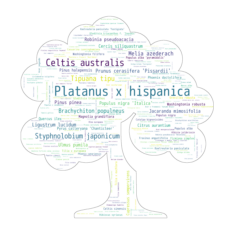

<Figure size 1440x1440 with 0 Axes>

In [13]:
weights = list()
weights_dict = dict()
font_path = "/Users/arnaugatell/Desktop/DTU/Social_Data_Analysis_and_Visualization/Assignments/Project/font_m__1m/mplus-1m-regular.ttf"

for index, row in df_arbrat_names.iterrows():
    weights.append((row['NOM_CIENTIFIC'], row['CODI']))
    
for k,v in weights:
    weights_dict[k] = int(v)

image_mask = np.array(Image.open("arbol.png"))

stopwords = set(STOPWORDS)

wc = WordCloud(height=1000, width=1000, background_color="white", max_words=2000, mask=image_mask,
               stopwords=STOPWORDS, contour_width=1, font_path=font_path)

# generate word cloud
wc.generate_from_frequencies(weights_dict)

# store to file
wc.to_file("trees_wc.png")

# show
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.figure(figsize=(20,20))
plt.show()

In [14]:
# Load dataset
df_arbrat_interactive = df_arbrat.copy(deep=True)
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['ANY_PLANTACIO']!='NO_DATA']
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['ANY_MES_PLANTACIO']!='NO_DATA']
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['TIPUS_REG']!='NO_DATA']
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['TIPUS_REG']!='SENSE INFORMAR']

# Three df grouped by
df_arbrat_year = df_arbrat_interactive.groupby(['ANY_PLANTACIO','TIPUS_REG'], as_index=False).count()
df_arbrat_year_month = df_arbrat_interactive.groupby(['ANY_MES_PLANTACIO','TIPUS_REG'], as_index=False).count()

# Initialize figure
fig = go.Figure()

irrigation_types = list()
# Add Traces
for irrigation_type in df_arbrat_interactive['TIPUS_REG'].unique():
    irrigation_types.append(str(irrigation_type))
    fig.add_trace(
        go.Bar(x=df_arbrat_year[df_arbrat_year['TIPUS_REG']==irrigation_type]['ANY_PLANTACIO'], 
               y=df_arbrat_year[df_arbrat_year['TIPUS_REG']==irrigation_type]['CODI'], 
               name=irrigation_type))
    fig.add_trace(
        go.Bar(x=df_arbrat_year_month[df_arbrat_year_month['TIPUS_REG']==irrigation_type]['ANY_MES_PLANTACIO'], 
               y=df_arbrat_year_month[df_arbrat_year_month['TIPUS_REG']==irrigation_type]['CODI'], 
               visible=False,
               name=irrigation_type))
        
    
# Add drowdowns
button_layer_1_height = 1.185
fig.update_layout(
    updatemenus=[
        dict(           
            buttons=list([
                dict(label="All by Year",
                     method="update",
                     args=[{"visible": [True, False, True, False, True, False,
                                        True, False, True, False, True, False,
                                        True, False, True, False, True, False
                                       ]},
                           {"title": "Type of irrigation devices"}]),
                dict(label="All by Year-Month",
                     method="update",
                     args=[{"visible": [False, True, False, True, False, True,
                                        False, True, False, True, False, True,
                                        False, True, False, True, False, True
                                       ]},
                           {"title": "Type of irrigation devices"}]),
            ]),            
            type="buttons",
            direction="right",
            active=0,
            x=1.0,
            y=1.15,
        ),
        dict(
            buttons=list([
                dict(label="All by Year",
                     method="update",
                     args=[{"visible": [True, False, True, False, True, False,
                                        True, False, True, False, True, False,
                                        True, False, True, False, True, False
                                       ]},
                           {"title": "Type of irrigation devices"}]),
                dict(label=str(irrigation_types[0]),
                     method="update",
                     args=[{"visible": [True] + 11*[False]},
                           {"title": "Type of irrigation device:<br>" + str(irrigation_types[0]) + " by Year"}]),
                dict(label=str(irrigation_types[1]),
                     method="update",
                     args=[{"visible": 2*[False] + [True] + 9*[False]},
                           {"title": "Type of irrigation device:<br>" + str(irrigation_types[1]) + " by Year"}]),
                dict(label=str(irrigation_types[2]),
                     method="update",
                     args=[{"visible": 4*[False] + [True] + 7*[False]},
                           {"title": "Type of irrigation device:<br>" + str(irrigation_types[2]) + " by Year"}]),
                dict(label=str(irrigation_types[3]),
                     method="update",
                     args=[{"visible": 6*[False] + [True] + 5*[False]},
                           {"title": "Type of irrigation device:<br>" + str(irrigation_types[3]) + " by Year"}]),
                dict(label=str(irrigation_types[4]),
                     method="update",
                     args=[{"visible": 8*[False] + [True] + 3*[False]},
                           {"title": "Type of irrigation device:<br>" + str(irrigation_types[4]) + " by Year"}]),
                dict(label=str(irrigation_types[5]),
                     method="update",
                     args=[{"visible": 10*[False] + [True] + [False]},
                           {"title": "Type of irrigation device:<br>" + str(irrigation_types[5]) + " by Year"}]),
            ]),
            direction="down",
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0.36,
            xanchor="left",
            y=button_layer_1_height,
            yanchor="top"
        ),
        dict(
            buttons=list([
                dict(label="All by Year-Month",
                     method="update",
                     args=[{"visible": [False, True, False, True, False, True,
                                        False, True, False, True, False, True,
                                        False, True, False, True, False, True
                                       ]},
                           {"title": "Type of irrigation devices"}]),
                dict(label=str(irrigation_types[0]),
                     method="update",
                     args=[{"visible": [False] + [True] + 10*[False]},
                           {"title": "Type of irrigation device:<br>" + str(irrigation_types[0]) + " by Year-month"}]),
                dict(label=str(irrigation_types[1]),
                     method="update",
                     args=[{"visible": 3*[False] + [True] + 8*[False]},
                           {"title": "Type of irrigation device:<br>" + str(irrigation_types[1]) + " by Year-month"}]),
                dict(label=str(irrigation_types[2]),
                     method="update",
                     args=[{"visible": 5*[False] + [True] + 6*[False]},
                           {"title": "Type of irrigation device:<br>" + str(irrigation_types[2]) + " by Year-month"}]),
                dict(label=str(irrigation_types[3]),
                     method="update",
                     args=[{"visible": 7*[False] + [True] + 4*[False]},
                           {"title": "Type of irrigation device:<br>" + str(irrigation_types[3]) + " by Year-month"}]),
                dict(label=str(irrigation_types[4]),
                     method="update",
                     args=[{"visible": 9*[False] + [True] + 2*[False]},
                           {"title": "Type of irrigation device:<br>" + str(irrigation_types[4]) + " by Year-month"}]),
                dict(label=str(irrigation_types[5]),
                     method="update",
                     args=[{"visible": 11*[False] + [True]},
                           {"title": "Type of irrigation device:<br>" + str(irrigation_types[5]) + " by Year-month"}]),          
            ]),
            direction="down",
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0.5,
            xanchor="left",
            y=button_layer_1_height,
            yanchor="top"
        ),
    ]
)

fig.update_layout(
    annotations=[
        dict(text="Year", x=0.38, xref="paper", y=1.23, yref="paper",
                             align="left", showarrow=False),
        dict(text="Year-Month", x=0.545, xref="paper", y=1.23, yref="paper",
                             showarrow=False)
    ])

# Add range slider
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=5,
                     label="last 5y",
                     step="year",
                     stepmode="backward"),
                dict(count=10,
                     label="last 10y",
                     step="year",
                     stepmode="backward"),
                dict(step="all")
            ]),
            x=0.8,
            y=1.21
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

# Set titles
fig.update_layout(
    title="Type of irrigation devices",
    xaxis_title="Date of planting",
    yaxis_title="Count of trees",
    autosize=False,
    width=1000,
    height=700,
)

fig.update_layout(legend=dict(x=0, y=1, bgcolor='rgba(255, 255, 255, 0)'))
fig.update_yaxes(automargin=True)

fig.show()
py.plot(fig, filename='type-of-irrigation-planting-date')

'https://plotly.com/~arnau.gp/32/'

In [15]:
# Load dataset
df_arbrat_interactive = df_arbrat.copy(deep=True)
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['MIDA_ESCOCELL']!='NO_DATA']
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['NOM_CIENTIFIC']!='NO_DATA']

df_arbrat_type_count = df_arbrat_interactive.groupby(['NOM_CIENTIFIC'], as_index=False).count()
df_arbrat_type_count = df_arbrat_type_count.sort_values(['CODI'], ascending=False)

# Three df grouped by
df_arbrat_mida = df_arbrat_interactive.groupby(['MIDA_ESCOCELL','NOM_CIENTIFIC'], as_index=False).count()

# Initialize figure
fig = go.Figure()

top_n = 6
tree_types = list()

# Add Traces
for tree_type in df_arbrat_type_count['NOM_CIENTIFIC'].unique()[:top_n]:
    tree_types.append(str(tree_type))
    fig.add_trace(
        go.Bar(x=df_arbrat_mida[df_arbrat_mida['NOM_CIENTIFIC']==tree_type]['MIDA_ESCOCELL'], 
               y=df_arbrat_mida[df_arbrat_mida['NOM_CIENTIFIC']==tree_type]['CODI'], 
               name=tree_type))
    

# Set titles
fig.update_layout(
    title="Tree pit size by tree specie",
    xaxis_title="Tree pit size",
    yaxis_title="Count of trees",
    autosize=False,
    width=1000,
    height=700,
#     barmode='stack', 
    xaxis={'categoryorder':'total descending'})

fig.update_layout(legend=dict(x=0.7, y=1, bgcolor='rgba(255, 255, 255, 0)'))
fig.update_yaxes(automargin=True)

fig.show()
py.plot(fig, filename='tree_pit_size-tree_specie')

'https://plotly.com/~arnau.gp/36/'

In [16]:
# Load dataset
df_arbrat_interactive = df_arbrat.copy(deep=True)
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['VORA_ESCOCELL']!='NO_DATA']
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['NOM_CIENTIFIC']!='NO_DATA']

df_arbrat_type_count = df_arbrat_interactive.groupby(['NOM_CIENTIFIC'], as_index=False).count()
df_arbrat_type_count = df_arbrat_type_count.sort_values(['CODI'], ascending=False)

# Three df grouped by
df_arbrat_mida = df_arbrat_interactive.groupby(['VORA_ESCOCELL','NOM_CIENTIFIC'], as_index=False).count()

# Initialize figure
fig = go.Figure()

top_n = 6
tree_types = list()

# Add Traces
for tree_type in df_arbrat_type_count['NOM_CIENTIFIC'].unique()[:top_n]:
    tree_types.append(str(tree_type))
    fig.add_trace(
        go.Bar(x=df_arbrat_mida[df_arbrat_mida['NOM_CIENTIFIC']==tree_type]['VORA_ESCOCELL'], 
               y=df_arbrat_mida[df_arbrat_mida['NOM_CIENTIFIC']==tree_type]['CODI'], 
               name=tree_type))
    

# Set titles
fig.update_layout(
    title="Tree pit edge by tree specie",
    xaxis_title="Tree pit edge",
    yaxis_title="Count of trees",
    autosize=False,
    width=1000,
    height=700,
#     barmode='stack', 
    xaxis={'categoryorder':'total descending'})

fig.update_layout(legend=dict(x=0.7, y=1, bgcolor='rgba(255, 255, 255, 0)'))
fig.update_yaxes(automargin=True)

fig.show()
py.plot(fig, filename='tree-pit-edge-tree-specie')

'https://plotly.com/~arnau.gp/34/'

In [17]:
# Load dataset
df_arbrat_interactive = df_arbrat.copy(deep=True)
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['TIPUS_SUPERFICIE']!='NO_DATA']
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['TIPUS_REG']!='NO_DATA']
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['TIPUS_REG']!='SENSE INFORMAR']

# Three df grouped by
df_arbrat_superf = df_arbrat_interactive.groupby(['TIPUS_SUPERFICIE','TIPUS_REG'], as_index=False).count()

# Initialize figure
fig = go.Figure()

x_superf = df_arbrat_interactive['TIPUS_SUPERFICIE'].unique()
irrigation_types = df_arbrat_interactive['TIPUS_REG'].unique()
# Add Traces
for surface in x_superf:
    fig.add_trace(
        go.Bar(name=surface, 
               y=df_arbrat_superf[df_arbrat_superf['TIPUS_SUPERFICIE']==surface]['CODI'], 
               x=df_arbrat_superf[df_arbrat_superf['TIPUS_SUPERFICIE']==surface]['TIPUS_REG']))

# Set titles
fig.update_layout(
    title="Type of irrigation devices by tree pit surface",
    xaxis_title="Irrigation type",
    yaxis_title="Count of trees",
    autosize=False,
    width=1000,
    height=700,
#     barmode='stack', 
    xaxis={'categoryorder':'total descending'})

fig.update_layout(legend=dict(x=0.7, y=1, bgcolor='rgba(255, 255, 255, 0)'))
fig.update_yaxes(automargin=True)

fig.show()
py.plot(fig, filename='irrigation-tree_pit_surface')

'https://plotly.com/~arnau.gp/38/'

In [18]:
# Load dataset
df_arbrat_interactive = df_arbrat.copy(deep=True)
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['TIPUS_SUPORT']!='NO_DATA']
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['TIPUS_REG']!='NO_DATA']
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['TIPUS_REG']!='SENSE INFORMAR']

# Three df grouped by
df_arbrat_suport = df_arbrat_interactive.groupby(['TIPUS_SUPORT','TIPUS_REG'], as_index=False).count()

# Initialize figure
fig = go.Figure()

x_suport = df_arbrat_interactive['TIPUS_SUPORT'].unique()
irrigation_types = df_arbrat_interactive['TIPUS_REG'].unique()
# Add Traces
for support in x_suport:
    fig.add_trace(
        go.Bar(name=support, 
               y=df_arbrat_suport[df_arbrat_suport['TIPUS_SUPORT']==support]['CODI'], 
               x=df_arbrat_suport[df_arbrat_suport['TIPUS_SUPORT']==support]['TIPUS_REG']))

# Set titles
fig.update_layout(
    title="Type of irrigation devices by tree pit support",
    xaxis_title="Irrigation type",
    yaxis_title="Count of trees",
    autosize=False,
    width=1000,
    height=700,
#     barmode='stack', 
    xaxis={'categoryorder':'total descending'})

fig.update_layout(legend=dict(x=0.8, y=1, bgcolor='rgba(255, 255, 255, 0)'))
fig.update_yaxes(automargin=True)

fig.show()
py.plot(fig, filename='irrigation-tree_pit_support')

'https://plotly.com/~arnau.gp/40/'

In [19]:
# Load dataset
df_arbrat_interactive = df_arbrat.copy(deep=True)
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['TIPUS_SUPERFICIE']!='NO_DATA']
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['TIPUS_REG']!='NO_DATA']
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['TIPUS_REG']!='SENSE INFORMAR']

# Three df grouped by
df_arbrat_superf = df_arbrat_interactive.groupby(['TIPUS_SUPERFICIE','TIPUS_REG'], as_index=False).count()

fig = go.Figure()

x_superf = df_arbrat_interactive['TIPUS_SUPERFICIE'].unique()
irrigation_types = df_arbrat_interactive['TIPUS_REG'].unique()
# Add Traces
for surface in x_superf:
    fig.add_trace(
        go.Scatterpolar(
            r=df_arbrat_superf[df_arbrat_superf['TIPUS_SUPERFICIE']==surface]['CODI'],
            theta=df_arbrat_superf[df_arbrat_superf['TIPUS_SUPERFICIE']==surface]['TIPUS_REG'],
            fill='toself',
            name=surface
        )
    )

# Add Buttons
fig.update_layout(
    updatemenus=[
        dict(
            dict(
            active=0,
            x=1.0,
            y=1.15,
            buttons=
                list([
                    dict(label="All",
                         method="update",
                         args=[{"visible": [True, True, True, True, True, True]},
                               {"title": "Type of irrigation devices by tree pit surface"}]),
                    dict(label=x_superf[0],
                         method="update",
                         args=[{"visible": [True, False, False, False, False, False]},
                               {"title": irrigation_types[0]}]),
                    dict(label=x_superf[1],
                         method="update",
                         args=[{"visible": [False, True, False, False, False, False]},
                               {"title": irrigation_types[1]}]),
                    dict(label=x_superf[2],
                         method="update",
                         args=[{"visible": [False, False, True, False, False, False]},
                               {"title": irrigation_types[2]}]),
                    dict(label=x_superf[3],
                         method="update",
                         args=[{"visible": [False, False, False, True, False, False]},
                               {"title": irrigation_types[3]}]),
                    dict(label=x_superf[4],
                         method="update",
                         args=[{"visible": [False, False, False, False, True, False]},
                               {"title": irrigation_types[4]}]),
                    dict(label=x_superf[5],
                         method="update",
                         args=[{"visible": [False, False, False, False, False, True]},
                               {"title": irrigation_types[5]}])
                ]),
            )
        )
    ])
    
fig.update_layout(
    title="Type of irrigation devices by tree pit surface",
    polar=dict(
    radialaxis=dict(
      visible=True,
    )),
    showlegend=False
)

fig.show()
py.plot(fig, filename='radar-irrigation-tree_pit_surface')

'https://plotly.com/~arnau.gp/42/'

In [20]:
# Load dataset
df_arbrat_interactive = df_arbrat.copy(deep=True)
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['TIPUS_SUPORT']!='NO_DATA']
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['TIPUS_REG']!='NO_DATA']
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['TIPUS_REG']!='SENSE INFORMAR']

# Three df grouped by
df_arbrat_suport = df_arbrat_interactive.groupby(['TIPUS_SUPORT','TIPUS_REG'], as_index=False).count()

fig = go.Figure()

x_support = df_arbrat_interactive['TIPUS_SUPORT'].unique()
irrigation_types = df_arbrat_interactive['TIPUS_REG'].unique()
# Add Traces
for support in x_support:
    fig.add_trace(
        go.Scatterpolar(
            r=df_arbrat_suport[df_arbrat_suport['TIPUS_SUPORT']==support]['CODI'],
            theta=df_arbrat_suport[df_arbrat_suport['TIPUS_SUPORT']==support]['TIPUS_REG'],
            fill='toself',
            name=support
        )
    )

# Add Buttons
fig.update_layout(
    updatemenus=[
        dict(
            dict(
            active=0,
            x=1.0,
            y=1.15,
            buttons=
                list([
                    dict(label="All",
                         method="update",
                         args=[{"visible": [True, True, True, True, True, True, True, True, True]},
                               {"title": "Type of irrigation devices by tree pit support"}]),
                    dict(label=x_support[0],
                         method="update",
                         args=[{"visible": [True, False, False, False, False, False, False, False, False]},
                               {"title": irrigation_types[0]}]),
                    dict(label=x_support[1],
                         method="update",
                         args=[{"visible": [False, True, False, False, False, False, False, False, False]},
                               {"title": irrigation_types[1]}]),
                    dict(label=x_support[2],
                         method="update",
                         args=[{"visible": [False, False, True, False, False, False, False, False, False]},
                               {"title": irrigation_types[2]}]),
                    dict(label=x_support[3],
                         method="update",
                         args=[{"visible": [False, False, False, True, False, False, False, False, False]},
                               {"title": irrigation_types[3]}]),
                    dict(label=x_support[4],
                         method="update",
                         args=[{"visible": [False, False, False, False, True, False, False, False, False]},
                               {"title": irrigation_types[4]}]),
                    dict(label=x_support[5],
                         method="update",
                         args=[{"visible": [False, False, False, False, False, True, False, False, False]},
                               {"title": irrigation_types[5]}]),
                    dict(label=x_support[6],
                         method="update",
                         args=[{"visible": [False, False, False, False, False, False, True, False, False]},
                               {"title": irrigation_types[5]}]),
                    dict(label=x_support[7],
                         method="update",
                         args=[{"visible": [False, False, False, False, False, False, False, True, False]},
                               {"title": irrigation_types[5]}]),
                    dict(label=x_support[8],
                         method="update",
                         args=[{"visible": [False, False, False, False, False, False, False, False, True]},
                               {"title": irrigation_types[5]}])
                ]),
            )
        )
    ])
    
fig.update_layout(
    title="Type of irrigation devices by tree pit support",
    polar=dict(
    radialaxis=dict(
      visible=True,
    )),
    showlegend=False
)

fig.show()
py.plot(fig, filename='radar-irrigation-tree_pit_support')

'https://plotly.com/~arnau.gp/44/'

In [21]:
# Load dataset
df_arbrat_interactive = df_arbrat.copy(deep=True)
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['ANY_PLANTACIO']!='NO_DATA']
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['ANY_MES_PLANTACIO']!='NO_DATA']
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['NOM_CIENTIFIC']!='NO_DATA']

df_arbrat_type_count = df_arbrat_interactive.groupby(['NOM_CIENTIFIC'], as_index=False).count()
df_arbrat_type_count = df_arbrat_type_count.sort_values(['CODI'], ascending=False)

# Three df grouped by
df_arbrat_year = df_arbrat_interactive.groupby(['ANY_PLANTACIO','NOM_CIENTIFIC'], as_index=False).count()
df_arbrat_year_month = df_arbrat_interactive.groupby(['ANY_MES_PLANTACIO','NOM_CIENTIFIC'], as_index=False).count()

# Initialize figure
fig = go.Figure()

top_n = 6
tree_types = list()
# Add Traces
for tree_type in df_arbrat_type_count['NOM_CIENTIFIC'].unique()[:top_n]:
    tree_types.append(str(tree_type))
    fig.add_trace(
        go.Bar(x=df_arbrat_year[df_arbrat_year['NOM_CIENTIFIC']==tree_type]['ANY_PLANTACIO'], 
               y=df_arbrat_year[df_arbrat_year['NOM_CIENTIFIC']==tree_type]['CODI'], 
               name=tree_type))
    fig.add_trace(
        go.Bar(x=df_arbrat_year_month[df_arbrat_year_month['NOM_CIENTIFIC']==tree_type]['ANY_MES_PLANTACIO'], 
               y=df_arbrat_year_month[df_arbrat_year_month['NOM_CIENTIFIC']==tree_type]['CODI'], 
               visible=False,
               name=tree_type))
        
    
# Add drowdowns
fig.update_layout(
    updatemenus=[
        dict(           
            buttons=list([
                dict(label="All by Year",
                     method="update",
                     args=[{"visible": [True, False, True, False, True, False,
                                        True, False, True, False, True, False,
                                        True, False, True, False, True, False
                                       ]},
                           {"title": "Top " + str(top_n) + " type of trees"}]),
                dict(label="All by Year-Month",
                     method="update",
                     args=[{"visible": [False, True, False, True, False, True,
                                        False, True, False, True, False, True,
                                        False, True, False, True, False, True
                                       ]},
                           {"title": "Top " + str(top_n) + " type of trees"}]),
            ]),            
            type="buttons",
            direction="right",
            active=0,
            x=1.0,
            y=1.15,
        ),
        dict(
            buttons=list([
                dict(label="All by Year",
                     method="update",
                     args=[{"visible": [True, False, True, False, True, False,
                                        True, False, True, False, True, False,
                                        True, False, True, False, True, False
                                       ]},
                           {"title": "Top " + str(top_n) + " type of trees"}]),
                dict(label=str(tree_types[0]),
                     method="update",
                     args=[{"visible": [True] + 11*[False]},
                           {"title": "Type of tree:<br>" + str(tree_types[0]) + " by Year"}]),
                dict(label=str(tree_types[1]),
                     method="update",
                     args=[{"visible": 2*[False] + [True] + 9*[False]},
                           {"title": "Type of tree:<br>" + str(tree_types[1]) + " by Year"}]),
                dict(label=str(tree_types[2]),
                     method="update",
                     args=[{"visible": 4*[False] + [True] + 7*[False]},
                           {"title": "Type of tree:<br>" + str(tree_types[2]) + " by Year"}]),
                dict(label=str(tree_types[3]),
                     method="update",
                     args=[{"visible": 6*[False] + [True] + 5*[False]},
                           {"title": "Type of tree:<br>" + str(tree_types[3]) + " by Year"}]),
                dict(label=str(tree_types[4]),
                     method="update",
                     args=[{"visible": 8*[False] + [True] + 3*[False]},
                           {"title": "Type of tree:<br>" + str(tree_types[4]) + " by Year"}]),
                dict(label=str(tree_types[5]),
                     method="update",
                     args=[{"visible": 10*[False] + [True] + [False]},
                           {"title": "Type of tree:<br>" + str(tree_types[5]) + " by Year"}]),
            ]),
            direction="down",
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0.38,
            xanchor="left",
            y=1.33,
            yanchor="top"
        ),
        dict(
            buttons=list([
                dict(label="All by Year-Month",
                     method="update",
                     args=[{"visible": [False, True, False, True, False, True,
                                        False, True, False, True, False, True,
                                        False, True, False, True, False, True
                                       ]},
                           {"title": "Top " + str(top_n) + " type of trees"}]),
                dict(label=str(tree_types[0]),
                     method="update",
                     args=[{"visible": [False] + [True] + 10*[False]},
                           {"title": "Type of tree:<br>" + str(tree_types[0]) + " by Year-month"}]),
                dict(label=str(tree_types[1]),
                     method="update",
                     args=[{"visible": 3*[False] + [True] + 8*[False]},
                           {"title": "Type of tree:<br>" + str(tree_types[1]) + " by Year-month"}]),
                dict(label=str(tree_types[2]),
                     method="update",
                     args=[{"visible": 5*[False] + [True] + 6*[False]},
                           {"title": "Type of tree:<br>" + str(tree_types[2]) + " by Year-month"}]),
                dict(label=str(tree_types[3]),
                     method="update",
                     args=[{"visible": 7*[False] + [True] + 4*[False]},
                           {"title": "Type of tree:<br>" + str(tree_types[3]) + " by Year-month"}]),
                dict(label=str(tree_types[4]),
                     method="update",
                     args=[{"visible": 9*[False] + [True] + 2*[False]},
                           {"title": "Type of tree:<br>" + str(tree_types[4]) + " by Year-month"}]),
                dict(label=str(tree_types[5]),
                     method="update",
                     args=[{"visible": 11*[False] + [True]},
                           {"title": "Type of tree:<br>" + str(tree_types[5]) + " by Year-month"}]),          
            ]),
            direction="down",
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0.38,
            xanchor="left",
            y=1.185,
            yanchor="top"
        ),
    ]
)

fig.update_layout(
    annotations=[
        dict(text="Year", x=0.345, xref="paper", y=1.275, yref="paper",
                             align="left", showarrow=False),
        dict(text="Year-Month", x=0.275, xref="paper", y=1.13, yref="paper",
                             showarrow=False)
    ])

# Add range slider
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=5,
                     label="last 5y",
                     step="year",
                     stepmode="backward"),
                dict(count=10,
                     label="last 10y",
                     step="year",
                     stepmode="backward"),
                dict(step="all")
            ]),
            x=0.8,
            y=1.21
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

# Set titles
fig.update_layout(
    title="Top " + str(top_n) + " type of trees",
    xaxis_title="Date of planting",
    yaxis_title="Count of trees",
    autosize=False,
    width=1000,
    height=700,
)

fig.update_layout(legend=dict(x=0, y=1, bgcolor='rgba(255, 255, 255, 0)'))
fig.update_yaxes(automargin=True)

fig.show()
py.plot(fig, filename='top6_tree_specie-date')

'https://plotly.com/~arnau.gp/46/'

In [22]:
# Load dataset
df_arbrat_interactive = df_arbrat.copy(deep=True)
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['ANY_PLANTACIO']!='NO_DATA']
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['ANY_MES_PLANTACIO']!='NO_DATA']
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['NOM_CIENTIFIC']!='NO_DATA']

df_arbrat_type_count = df_arbrat_interactive.groupby(['NOM_CIENTIFIC'], as_index=False).count()
df_arbrat_type_count = df_arbrat_type_count.sort_values(['CODI'], ascending=False)

# Three df grouped by
df_arbrat_year = df_arbrat_interactive.groupby(['ANY_PLANTACIO','NOM_CIENTIFIC'], as_index=False).count()
df_arbrat_year_month = df_arbrat_interactive.groupby(['ANY_MES_PLANTACIO','NOM_CIENTIFIC'], as_index=False).count()

# Initialize figure
fig = go.Figure()

top_n = 6
tree_types = list()
# Add Traces
for tree_type in df_arbrat_type_count['NOM_CIENTIFIC'].unique()[:top_n]:
    tree_types.append(str(tree_type))
    fig.add_trace(
        go.Bar(x=df_arbrat_year[df_arbrat_year['NOM_CIENTIFIC']==tree_type]['ANY_PLANTACIO'], 
               y=df_arbrat_year[df_arbrat_year['NOM_CIENTIFIC']==tree_type]['CODI'], 
               name=tree_type))
    fig.add_trace(
        go.Bar(x=df_arbrat_year_month[df_arbrat_year_month['NOM_CIENTIFIC']==tree_type]['ANY_MES_PLANTACIO'], 
               y=df_arbrat_year_month[df_arbrat_year_month['NOM_CIENTIFIC']==tree_type]['CODI'], 
               visible=False,
               name=tree_type))
        
    
# Add drowdowns
fig.update_layout(
    updatemenus=[
        dict(           
            buttons=list([
                dict(label="All by Year",
                     method="update",
                     args=[{"visible": [True, False, True, False, True, False,
                                        True, False, True, False, True, False,
                                        True, False, True, False, True, False
                                       ]},
                           {"title": "Top " + str(top_n) + " type of trees"}]),

                dict(label="All by Year-Month",
                     method="update",
                     args=[{"visible": [False, True, False, True, False, True,
                                        False, True, False, True, False, True,
                                        False, True, False, True, False, True
                                       ]},
                           {"title": "Top " + str(top_n) + " type of trees"}]),
            ]),            
            type="buttons",
            direction="right",
            active=0,
            x=1.0,
            y=1.15,
        ),
        dict(
            buttons=list([
                dict(label="All by Year",
                     method="update",
                     args=[{"visible": [True, False, True, False, True, False,
                                        True, False, True, False, True, False,
                                        True, False, True, False, True, False
                                       ]},
                           {"title": "Top " + str(top_n) + " type of trees"}]),
                dict(label=str(tree_types[0]),
                     method="update",
                     args=[{"visible": [True] + 11*[False]},
                           {"title": "Type of tree:<br>" + str(tree_types[0]) + " by Year"}]),
                dict(label=str(tree_types[1]),
                     method="update",
                     args=[{"visible": 2*[False] + [True] + 9*[False]},
                           {"title": "Type of tree:<br>" + str(tree_types[1]) + " by Year"}]),
                dict(label=str(tree_types[2]),
                     method="update",
                     args=[{"visible": 4*[False] + [True] + 7*[False]},
                           {"title": "Type of tree:<br>" + str(tree_types[2]) + " by Year"}]),
                dict(label=str(tree_types[3]),
                     method="update",
                     args=[{"visible": 6*[False] + [True] + 5*[False]},
                           {"title": "Type of tree:<br>" + str(tree_types[3]) + " by Year"}]),
                dict(label=str(tree_types[4]),
                     method="update",
                     args=[{"visible": 8*[False] + [True] + 3*[False]},
                           {"title": "Type of tree:<br>" + str(tree_types[4]) + " by Year"}]),
                dict(label=str(tree_types[5]),
                     method="update",
                     args=[{"visible": 10*[False] + [True] + [False]},
                           {"title": "Type of tree:<br>" + str(tree_types[5]) + " by Year"}]),
            ]),
            direction="down",
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0.38,
            xanchor="left",
            y=1.33,
            yanchor="top"
        ),

        dict(
            buttons=list([
                dict(label="All by Year-Month",
                     method="update",
                     args=[{"visible": [False, True, False, True, False, True,
                                        False, True, False, True, False, True,
                                        False, True, False, True, False, True
                                       ]},
                           {"title": "Top " + str(top_n) + " type of trees"}]),
                dict(label=str(tree_types[0]),
                     method="update",
                     args=[{"visible": [False] + [True] + 10*[False]},
                           {"title": "Type of tree:<br>" + str(tree_types[0]) + " by Year-month"}]),
                dict(label=str(tree_types[1]),
                     method="update",
                     args=[{"visible": 3*[False] + [True] + 8*[False]},
                           {"title": "Type of tree:<br>" + str(tree_types[1]) + " by Year-month"}]),
                dict(label=str(tree_types[2]),
                     method="update",
                     args=[{"visible": 5*[False] + [True] + 6*[False]},
                           {"title": "Type of tree:<br>" + str(tree_types[2]) + " by Year-month"}]),
                dict(label=str(tree_types[3]),
                     method="update",
                     args=[{"visible": 7*[False] + [True] + 4*[False]},
                           {"title": "Type of tree:<br>" + str(tree_types[3]) + " by Year-month"}]),
                dict(label=str(tree_types[4]),
                     method="update",
                     args=[{"visible": 9*[False] + [True] + 2*[False]},
                           {"title": "Type of tree:<br>" + str(tree_types[4]) + " by Year-month"}]),
                dict(label=str(tree_types[5]),
                     method="update",
                     args=[{"visible": 11*[False] + [True]},
                           {"title": "Type of tree:<br>" + str(tree_types[5]) + " by Year-month"}]),          
            ]),
            direction="down",
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0.38,
            xanchor="left",
            y=1.185,
            yanchor="top"
        ),
    ]
)

fig.update_layout(
    annotations=[
        dict(text="Year", x=0.345, xref="paper", y=1.275, yref="paper",
                             align="left", showarrow=False),
        dict(text="Year-Month", x=0.275, xref="paper", y=1.13, yref="paper",
                             showarrow=False)
    ])

# Add range slider
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=5,
                     label="last 5y",
                     step="year",
                     stepmode="backward"),
                dict(count=10,
                     label="last 10y",
                     step="year",
                     stepmode="backward"),
                dict(step="all")
            ]),
            x=0.8,
            y=1.21
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

# Set titles
fig.update_layout(
    title="Top " + str(top_n) + " type of trees",
    xaxis_title="Date of planting",
    yaxis_title="Count of trees",
    autosize=False,
    barmode='stack',
    width=1000,
    height=700,
)

fig.update_layout(legend=dict(x=0, y=1, bgcolor='rgba(255, 255, 255, 0)'))
fig.update_yaxes(automargin=True)

fig.show()
py.plot(fig, filename='top6_tree_specie-date-stacked')

'https://plotly.com/~arnau.gp/52/'

In [23]:
lat_BCN = 41.408000
lon_BCN = 2.154007

# Load dataset
df_arbrat_interactive = df_arbrat.copy(deep=True)
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['NOM_CIENTIFIC']!='NO_DATA']
df_arbrat_interactive_count = df_arbrat_interactive.groupby(['NOM_CIENTIFIC'], as_index=False).count()
df_arbrat_interactive_count = df_arbrat_interactive_count.sort_values(['CODI'], ascending=False)

top_n = 6

# Initialize figure
fig = go.Figure()

tree_names = list()
# Add Traces
# fig.add_trace(
#         go.Densitymapbox(lat=df_arbrat_interactive["LATITUD_WGS84"], 
#                            lon=df_arbrat_interactive['LONGITUD_WGS84'], 
#                            radius=4))

for tree_name in df_arbrat_interactive_count['NOM_CIENTIFIC'].unique()[:top_n]:
    tree_names.append(str(tree_name))
    fig.add_trace(
        go.Densitymapbox(lat=df_arbrat_interactive[df_arbrat_interactive['NOM_CIENTIFIC']==tree_name]["LATITUD_WGS84"], 
                           lon=df_arbrat_interactive[df_arbrat_interactive['NOM_CIENTIFIC']==tree_name]['LONGITUD_WGS84'], 
                           radius=4))
    

# Add Buttons
fig.update_layout(
    updatemenus=[
        dict(
            dict(
#             active=0,
#             type="buttons",
#             direction="right",
            active=0,
            x=0.8,
            y=0.99,
            buttons=
                list([
                    dict(label="All top 6 tree species",
                         method="update",
                         args=[{"visible": [True, True, True, True, True, True]},
                               {"title": "All top 6 tree species"}]),
                    dict(label=tree_names[0],
                         method="update",
                         args=[{"visible": [True, False, False, False, False, False]},
                               {"title": tree_names[0]}]),
                    dict(label=tree_names[1],
                         method="update",
                         args=[{"visible": [False, True, False, False, False, False]},
                               {"title": tree_names[1]}]),
                    dict(label=tree_names[2],
                         method="update",
                         args=[{"visible": [False, False, True, False, False, False]},
                               {"title": tree_names[2]}]),
                    dict(label=tree_names[3],
                         method="update",
                         args=[{"visible": [False, False, False, True, False, False]},
                               {"title": tree_names[3]}]),
                    dict(label=tree_names[4],
                         method="update",
                         args=[{"visible": [False, False, False, False, True, False]},
                               {"title": tree_names[4]}]),
                    dict(label=tree_names[5],
                         method="update",
                         args=[{"visible": [False, False, False, False, False, True]},
                               {"title": tree_names[5]}])
                ]),
            )
        )
    ])
    
fig.update_layout(mapbox_style="stamen-terrain", 
                  mapbox_center_lon=lon_BCN,
                  mapbox_center_lat=lat_BCN,
                  mapbox_zoom=12
                 )

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

<Figure size 432x288 with 0 Axes>

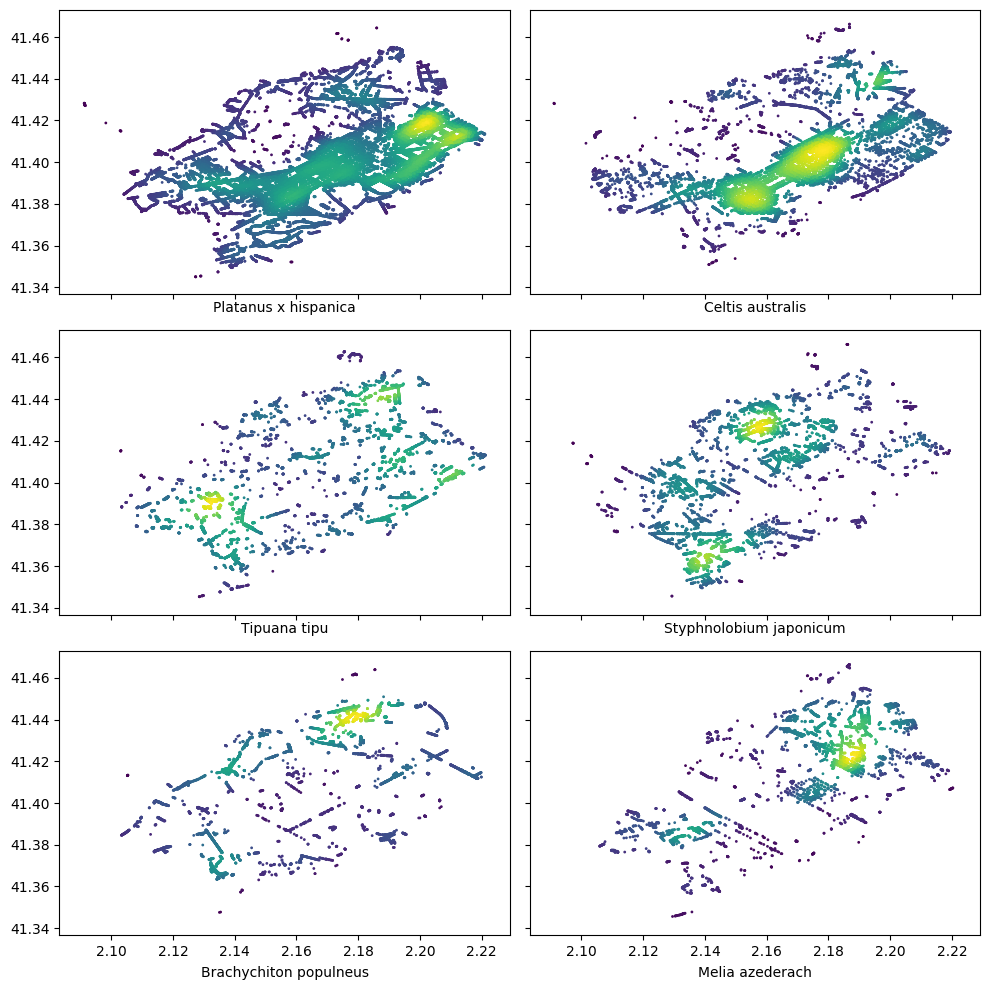

In [24]:
lat_BCN = 41.408000
lon_BCN = 2.154007

# Load dataset
df_arbrat_interactive = df_arbrat.copy(deep=True)
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['NOM_CIENTIFIC']!='NO_DATA']
df_arbrat_interactive_count = df_arbrat_interactive.groupby(['NOM_CIENTIFIC'], as_index=False).count()
df_arbrat_interactive_count = df_arbrat_interactive_count.sort_values(['CODI'], ascending=False)

top_n = 6

tree_names = list()

for tree_name in df_arbrat_interactive_count['NOM_CIENTIFIC'].unique()[:top_n]:
    tree_names.append(str(tree_name))

# Initialize figure
f = plt.figure()    
f, axes = plt.subplots(nrows = 3, 
                       ncols = 2, 
                       sharex=True, 
                       sharey = True, 
                       figsize=(10,10), 
                       dpi=100)

# Add Traces
i=1
row_num=0
col_num=0
for tree_name in tree_names:
    x=df_arbrat_interactive[df_arbrat_interactive['NOM_CIENTIFIC']==tree_name]['LONGITUD_WGS84']
    y=df_arbrat_interactive[df_arbrat_interactive['NOM_CIENTIFIC']==tree_name]["LATITUD_WGS84"]
    # Calculate the point density
    xy = np.vstack([x,y])
    z = gaussian_kde(xy)(xy)
    axes[row_num][col_num].scatter(x=x,
                                   y=y,
                                   c=z,
                                   s=1,
                                   marker = "o")
    axes[row_num][col_num].set_xlabel(tree_name, labelpad = 5)
    
    if i%2 == 0:
        row_num += 1
        col_num = 0
    else:
        col_num += 1
        
    i+=1

plt.tight_layout()
plt.savefig('heatmap_subplots_tree_type.png')
plt.show()

In [25]:
lat_BCN = 41.408000
lon_BCN = 2.154007

# Load dataset
df_arbrat_interactive = df_gardens.copy(deep=True)
df_arbrat_interactive = df_arbrat_interactive[df_arbrat_interactive['LATITUD']!='NO_DATA']

# Initialize figure
fig = go.Figure()

# Add Traces
fig.add_trace(
        go.Scattermapbox(lat=df_arbrat_interactive["LATITUD"],
                         lon=df_arbrat_interactive['LONGITUD'],
                         marker=go.scattermapbox.Marker(size=10, color='rgb(125, 255, 125)'),
                         text=df_arbrat_interactive['EQUIPAMENT']
                        ))
    
fig.update_layout(mapbox_style="stamen-terrain", 
                  mapbox_center_lon=lon_BCN,
                  mapbox_center_lat=lat_BCN,
                  mapbox_zoom=12
                 )

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()
py.plot(fig, filename='gardens_and_parks-location')

/Users/arnaugatell/python3venv/lib/python3.7/site-packages/pandas/core/ops/__init__.py:1115: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



'https://plotly.com/~arnau.gp/48/'

## 6. Discussion
* What went well?
    * Data quality was good. The datasets did not have temporary series but outliers were not a problem.
    * Plotly is a super powerful tool and with a lot of different interactive graphs. Also offers graphs hosting for free and is possible to upload them directly when they are created in the notebook.
* What is still missing? What could be improved? Why?
    * Plotly online community is not as big as other libraries' community. It has been a pain to configure some small details of the charts.
    * The heat map cannot be uploaded to Plotly since its too heavy for the free account plan.
    * The chosen topic is not as exciting as others, therefore its insights are not super cool.
    * Data about population density and pollution was not enough in Open Data BCN and it has not been possible to link the trees dataset with some other data.

## 7. Contributions
This notebook has been done by Arnau Gatell, DTU student number 192334.

## 8. References
* Datasets: https://opendata-ajuntament.barcelona.cat/
* Plotly visualization library guide: https://plotly.com
* http://www.fao.org/zhc/detail-events/en/c/454543/
* Stylish wordclouds: https://minimaxir.com/2016/05/wordclouds/
* Trees oxygen production: https://www.sciencefocus.com/planet-earth/how-many-trees-does-it-take-to-produce-oxygen-for-one-person/